In [1]:
import numpy as np
import pandas as pd
import math
import os
import sys
import glob
import time
import pickle
import time
import altair as alt
alt.data_transformers.disable_max_rows()

import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
from matplotlib import rc
plt.style.use('classic')
rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
rc('text', usetex=True)
rc('figure', facecolor='w')
rc('xtick', labelsize=20)
rc('ytick', labelsize=20)

import multiprocessing as mp
from multiprocessing import Pool
print("Number of processors: ", mp.cpu_count())

sys.path.append('/astro/users/jbirky/projects/tess_binaries')
os.environ['TESS_DATA'] = '/data/epyc/projects2/tess'

import tess_binaries as tb

Number of processors:  96


In [2]:
tess_xm = pd.read_csv(tb.cat_dir + '/asassn_tess_xm.csv.gz')

In [ ]:
tess_xm.keys()

In [ ]:
t0 = time.time()
for i in range(5):
    ps = tb.computePowerSpectra(tess_xm['tic_id'][i])
    tb.plotTimeSeries(ps, label=f"{tess_xm['Type'][i]}  Period: {tess_xm['period'][i]}", save_dir=f'{tb.plot_dir}/asassn_var_stars')
t1 = time.time() - t0

In [6]:
psamp = tess_xm[~np.isnan(tess_xm['period'])]

In [ ]:
plt.hist(psamp['period'], bins=np.linspace(0,1000,100))
# plt.yscale('log')
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fa1bea69e48>]],
      dtype=object)

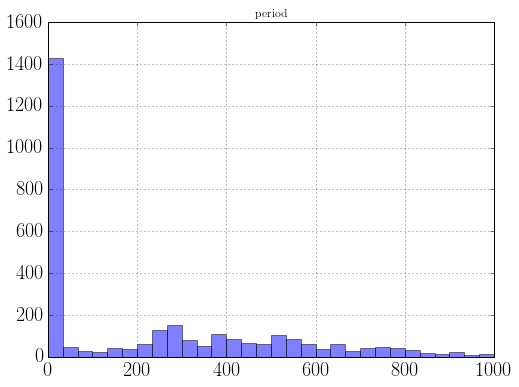

In [11]:
psamp.hist(column='period', bins=30, alpha=0.5, figsize=[8,6])

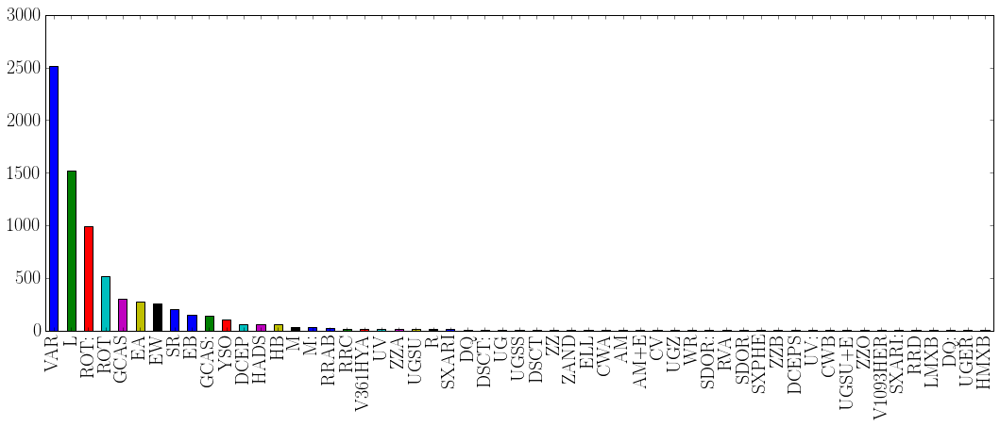

In [10]:
tess_xm['Type'].value_counts().plot(kind='bar', figsize=[18,6])

In [ ]:
tess_xm['g_abs'] = tess_xm['gmag'] + 5*tess_xm['parallax'] - 10
plt.scatter(tess_xm['BP-RP'], tess_xm['gmag'], edgecolor='none')
plt.ylim(20,-2)
plt.show()

In [4]:
alt.Chart(tess_xm).mark_circle(size=60).encode(
    x='BP-RP',
    y='gmag',
    color='Type',
    tooltip=['tic_id']
).interactive()

<VegaLite 3 object>

If you see this message, it means the renderer has not been properly enabled
for the frontend that you are using. For more information, see
https://altair-viz.github.io/user_guide/troubleshooting.html


In [ ]:
print(alt.renderers.active)